
# 
## <p style="background-color:white;font-family:newtimeroman;color:#4A3E97;font-size:150%;text-align:center;border-radius:20px 60px;">British Airways Customers Review Web Scraping and EDA </p>
![](https://d24ndt2yiijez0.cloudfront.net/uploads/carrier/logo/218/british-airways-logo.jpg)

## Web scraping and data collection from skytrax customer feedback website



### Data collection and methodology
* Data Collection through skytrax API

  First to carry out the analysis, all the necessary and relevant libraries were imported on the jupiter Notebook.
  these libraries includes:
  
  * numpy
  * pandas
  * BeautifulSoup
  * requests


In [1]:
import numpy as np
import pandas as pd
from bs4 import BeautifulSoup
import requests 

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import datetime as dt


### Create An Empty list to collect scrape data 

In [2]:
review_head = []

review_detail  = []

rating_stars = []

date = []

country = []

review_value = []

review_items =[]


In [3]:
for i in range(1, 37):
    page = requests.get(f"https://www.airlinequality.com/airline-reviews/british-airways/?sortby=post_date%3ADesc&pagesize=100")
    
    soup = BeautifulSoup(page.content, "html5")
    
            
    for item in soup.find_all("h2", class_="text_header"):
        review_head.append(item.text)
    
    for item in soup.find_all("div", class_="text_content"):
        review_detail.append(item.text)

    for item in soup.find_all("div", class_ = "rating-10"):
        try:
            rating_stars.append(item.span.text)
        except:
            print(f"Error on page {i}")
            rating_stars.append("None") 
    
    for item in soup.find_all("time"):
        date.append(item.text)
        
    for item in soup.find_all("h3"):
        country.append(item.span.next_sibling.text.strip(" ()"))
            
    for item in soup.find_all("td", class_ = "review-value"):
        review_value.append(item.text)

    for item in soup.find_all("td", class_ = "review-rating-header"):
        review_items.append(item.text)

In [4]:
review_items

['Food & Beverages',
 'Inflight Entertainment',
 'Seat Comfort',
 'Staff Service',
 'Value for Money',
 'Type Of Traveller',
 'Seat Type',
 'Route',
 'Date Flown',
 'Seat Comfort',
 'Cabin Staff Service',
 'Food & Beverages',
 'Inflight Entertainment',
 'Ground Service',
 'Value For Money',
 'Recommended',
 'Aircraft',
 'Type Of Traveller',
 'Seat Type',
 'Route',
 'Date Flown',
 'Seat Comfort',
 'Cabin Staff Service',
 'Food & Beverages',
 'Ground Service',
 'Value For Money',
 'Recommended',
 'Type Of Traveller',
 'Seat Type',
 'Route',
 'Date Flown',
 'Ground Service',
 'Value For Money',
 'Recommended',
 'Aircraft',
 'Type Of Traveller',
 'Seat Type',
 'Route',
 'Date Flown',
 'Seat Comfort',
 'Cabin Staff Service',
 'Food & Beverages',
 'Ground Service',
 'Value For Money',
 'Recommended',
 'Type Of Traveller',
 'Seat Type',
 'Route',
 'Date Flown',
 'Seat Comfort',
 'Cabin Staff Service',
 'Food & Beverages',
 'Inflight Entertainment',
 'Ground Service',
 'Wifi & Connectivity',
 

### Convert review_items to pandas Series

In [5]:
review_items=pd.Series(review_items)
review_items

0              Food & Beverages
1        Inflight Entertainment
2                  Seat Comfort
3                 Staff Service
4               Value for Money
                  ...          
38803    Inflight Entertainment
38804            Ground Service
38805       Wifi & Connectivity
38806           Value For Money
38807               Recommended
Length: 38808, dtype: object

In [6]:
review_items=review_items.loc[review_items != "Food & Beverages"]
review_items=review_items.loc[review_items != "Inflight Entertainment"]
review_items=review_items.loc[review_items != "Seat Comfort"]
review_items=review_items.loc[review_items != "Staff Service"]
review_items=review_items.loc[review_items != "Value for Money"]
review_items=review_items.loc[review_items != "Cabin Staff Service"]
review_items=review_items.loc[review_items != "Wifi & Connectivity"]
review_items=review_items.loc[review_items != "Recommended"]
review_items=review_items.loc[review_items != "Ground Service"]

In [7]:
review_items = review_items.reset_index(drop=True)

In [8]:
review_items

0        Type Of Traveller
1                Seat Type
2                    Route
3               Date Flown
4          Value For Money
               ...        
19867    Type Of Traveller
19868            Seat Type
19869                Route
19870           Date Flown
19871      Value For Money
Length: 19872, dtype: object

In [9]:
len(review_items)

19872

### Convert review_value to pandas Series

In [10]:
review_value = pd.Series(review_value)
review_value

0                                    Solo Leisure
1                                  Business Class
2                             London to Hong Kong
3                                       July 2023
4                                              no
                           ...                   
19867                              Family Leisure
19868                               Economy Class
19869    Marseille to Seattle via London Heathrow
19870                                   June 2023
19871                                          no
Length: 19872, dtype: object

### Concatenate revies_item and revies_datail

In [11]:
Conca_df=pd.concat([review_items,review_value],axis=1)
Conca_df.head(40)

,0,1
0,Type Of Traveller,Solo Leisure
1,Seat Type,Business Class
2,Route,London to Hong Kong
3,Date Flown,July 2023
4,Value For Money,no
5,Aircraft,A320
6,Type Of Traveller,Couple Leisure
7,Seat Type,Economy Class
8,Route,Catania to Gatwick
9,Date Flown,October 2023


### Extract value for typeOftraveller,seatType and seatType 

#### Convert the pandas Series to list

In [12]:
typeOftraveller = Conca_df.loc[Conca_df[0] == 'Type Of Traveller']
typeOftraveller = typeOftraveller.reset_index(drop=True)
typeOftraveller = typeOftraveller.iloc[: , 1:]
typeOftraveller = typeOftraveller[1].tolist()

In [13]:
seatType = Conca_df.loc[Conca_df[0] == 'Seat Type']
seatType = seatType.reset_index(drop=True)
seatType = seatType.iloc[: , 1:]
seatType = seatType[1].tolist()

In [14]:
ValueFormoney = Conca_df.loc[Conca_df[0] == 'Value For Money']
ValueFormoney = ValueFormoney.reset_index(drop=True)
ValueFormoney  = ValueFormoney.iloc[: , 1:]
ValueFormoney = ValueFormoney[1].tolist()

### Check the length

In [15]:
rating_stars = rating_stars[:len(typeOftraveller)]
len(rating_stars)

3564

In [16]:
len(review_value)

19872

In [17]:
review_detail = review_detail[:len(typeOftraveller)]
len(review_detail)

3564

In [18]:
len(review_value)

19872

In [19]:
typeOftraveller = typeOftraveller[:len(typeOftraveller)]
len(typeOftraveller)

3564

In [20]:
country = country[:len(typeOftraveller)]
len(country)

3564

In [21]:
seatType = seatType[:len(typeOftraveller)]
len(seatType)

3564

In [22]:
rating_stars= rating_stars[:len(typeOftraveller)]
len(rating_stars)

3564

In [23]:
ValueFormoney= ValueFormoney[:len(typeOftraveller)]
len(ValueFormoney)

3564

In [24]:
review_head= review_head[:len(typeOftraveller)]
len(review_head)

3564

In [25]:
review_detail= review_detail[:len(typeOftraveller)]
len(review_detail)

3564

In [26]:
date= date[:len(typeOftraveller)]
len(date)

3564

## British Airway Scraped Data

In [27]:
BA_Scraped_data = pd.DataFrame({"typeOftraveller": typeOftraveller, "country": country, "seatType": seatType, "rating_stars": rating_stars,  "ValueFormoney": ValueFormoney, "review_head": review_head,  "review_detail":review_detail,  "date": date, })
BA_Scraped_data

,typeOftraveller,country,seatType,rating_stars,ValueFormoney,review_head,review_detail,date
0,Solo Leisure,Australia,Business Class,\n\t\t\t\t\t\t\t\t\t\t\t\t\t5,no,"""some sort of medieval torture""",✅ Trip Verified | They downgraded me from bu...,12th October 2023
1,Couple Leisure,United Kingdom,Economy Class,1,no,"""Never again BA""",✅ Trip Verified | The already delayed aircra...,11th October 2023
2,Couple Leisure,United Kingdom,Economy Class,1,no,"""BA Gatwick are not BA""",✅ Trip Verified | Caught up in the Gatwick c...,11th October 2023
3,Solo Leisure,United Kingdom,Economy Class,2,no,"""Boarding flight took an hour""",✅ Trip Verified | BA has a real problem with...,10th October 2023
4,Couple Leisure,United States,Economy Class,1,no,"""our luggage was soaking wet""",✅ Trip Verified | Our connecting flight from L...,8th October 2023
...,...,...,...,...,...,...,...,...
3559,Couple Leisure,United Kingdom,Economy Class,6,no,"""bumped off due to overselling""",✅ Trip Verified | Couldn’t book in online. Ar...,31st July 2023
3560,Business,Iceland,Business Class,1,yes,"""a very comfortable flight""",✅ Trip Verified | London Heathrow to Mumbai in...,31st July 2023
3561,Couple Leisure,Iceland,Business Class,2,yes,"""good onboard service""","✅ Trip Verified | Keflavík, Iceland to London ...",31st July 2023
3562,Couple Leisure,Canada,Economy Class,1,no,"""they have really gone downhill""",✅ Trip Verified | Terrible Experience with Bri...,29th July 2023


## Decriptive Data Analysis

In [28]:
BA_Scraped_data.describe()

,typeOftraveller,country,seatType,rating_stars,ValueFormoney,review_head,review_detail,date
count,3564,3564,3564,3564,3564,3564,3564,3564
unique,4,19,4,10,2,100,100,67
top,Couple Leisure,United Kingdom,Economy Class,1,no,"""some sort of medieval torture""",✅ Trip Verified | They downgraded me from bu...,4th September 2023
freq,1440,1887,2028,1977,2956,36,36,144


In [29]:
BA_Scraped_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3564 entries, 0 to 3563
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   typeOftraveller  3564 non-null   object
 1   country          3564 non-null   object
 2   seatType         3564 non-null   object
 3   rating_stars     3564 non-null   object
 4   ValueFormoney    3564 non-null   object
 5   review_head      3564 non-null   object
 6   review_detail    3564 non-null   object
 7   date             3564 non-null   object
dtypes: object(8)
memory usage: 222.9+ KB


In [30]:
BA_Scraped_data.shape

(3564, 8)

In [31]:
BA_Scraped_data.isnull().sum()

typeOftraveller    0
country            0
seatType           0
rating_stars       0
ValueFormoney      0
review_head        0
review_detail      0
date               0
dtype: int64

In [32]:
BA_Scraped_data.nunique()

typeOftraveller      4
country             19
seatType             4
rating_stars        10
ValueFormoney        2
review_head        100
review_detail      100
date                67
dtype: int64

In [33]:
BA_Scraped_data["rating_stars"].unique()

array(['\n\t\t\t\t\t\t\t\t\t\t\t\t\t5', '1', '2', '10', '3', '4', '6',
       '8', '7', '9'], dtype=object)

## Data Cleaning

In [34]:

# Split string column into two new columns
BA_Scraped_data[['verified_status', 'review_datails']] = BA_Scraped_data.review_detail.str.split("|", expand = True)
BA_Scraped_data


,typeOftraveller,country,seatType,rating_stars,ValueFormoney,review_head,review_detail,date,verified_status,review_datails
0,Solo Leisure,Australia,Business Class,\n\t\t\t\t\t\t\t\t\t\t\t\t\t5,no,"""some sort of medieval torture""",✅ Trip Verified | They downgraded me from bu...,12th October 2023,✅ Trip Verified,They downgraded me from business to premium...
1,Couple Leisure,United Kingdom,Economy Class,1,no,"""Never again BA""",✅ Trip Verified | The already delayed aircra...,11th October 2023,✅ Trip Verified,The already delayed aircraft landed and apa...
2,Couple Leisure,United Kingdom,Economy Class,1,no,"""BA Gatwick are not BA""",✅ Trip Verified | Caught up in the Gatwick c...,11th October 2023,✅ Trip Verified,Caught up in the Gatwick cancellation fiasc...
3,Solo Leisure,United Kingdom,Economy Class,2,no,"""Boarding flight took an hour""",✅ Trip Verified | BA has a real problem with...,10th October 2023,✅ Trip Verified,BA has a real problem with boarding it's fl...
4,Couple Leisure,United States,Economy Class,1,no,"""our luggage was soaking wet""",✅ Trip Verified | Our connecting flight from L...,8th October 2023,✅ Trip Verified,Our connecting flight from London to Glasgow ...
...,...,...,...,...,...,...,...,...,...,...
3559,Couple Leisure,United Kingdom,Economy Class,6,no,"""bumped off due to overselling""",✅ Trip Verified | Couldn’t book in online. Ar...,31st July 2023,✅ Trip Verified,Couldn’t book in online. Arrived at check in...
3560,Business,Iceland,Business Class,1,yes,"""a very comfortable flight""",✅ Trip Verified | London Heathrow to Mumbai in...,31st July 2023,✅ Trip Verified,London Heathrow to Mumbai in a Boeing 787-8 i...
3561,Couple Leisure,Iceland,Business Class,2,yes,"""good onboard service""","✅ Trip Verified | Keflavík, Iceland to London ...",31st July 2023,✅ Trip Verified,"Keflavík, Iceland to London Heathrow on an A3..."
3562,Couple Leisure,Canada,Economy Class,1,no,"""they have really gone downhill""",✅ Trip Verified | Terrible Experience with Bri...,29th July 2023,✅ Trip Verified,Terrible Experience with British Airways. I b...


In [35]:

BA_Scraped_data  = BA_Scraped_data.drop(['review_detail'], axis=1)
BA_Scraped_data

,typeOftraveller,country,seatType,rating_stars,ValueFormoney,review_head,date,verified_status,review_datails
0,Solo Leisure,Australia,Business Class,\n\t\t\t\t\t\t\t\t\t\t\t\t\t5,no,"""some sort of medieval torture""",12th October 2023,✅ Trip Verified,They downgraded me from business to premium...
1,Couple Leisure,United Kingdom,Economy Class,1,no,"""Never again BA""",11th October 2023,✅ Trip Verified,The already delayed aircraft landed and apa...
2,Couple Leisure,United Kingdom,Economy Class,1,no,"""BA Gatwick are not BA""",11th October 2023,✅ Trip Verified,Caught up in the Gatwick cancellation fiasc...
3,Solo Leisure,United Kingdom,Economy Class,2,no,"""Boarding flight took an hour""",10th October 2023,✅ Trip Verified,BA has a real problem with boarding it's fl...
4,Couple Leisure,United States,Economy Class,1,no,"""our luggage was soaking wet""",8th October 2023,✅ Trip Verified,Our connecting flight from London to Glasgow ...
...,...,...,...,...,...,...,...,...,...
3559,Couple Leisure,United Kingdom,Economy Class,6,no,"""bumped off due to overselling""",31st July 2023,✅ Trip Verified,Couldn’t book in online. Arrived at check in...
3560,Business,Iceland,Business Class,1,yes,"""a very comfortable flight""",31st July 2023,✅ Trip Verified,London Heathrow to Mumbai in a Boeing 787-8 i...
3561,Couple Leisure,Iceland,Business Class,2,yes,"""good onboard service""",31st July 2023,✅ Trip Verified,"Keflavík, Iceland to London Heathrow on an A3..."
3562,Couple Leisure,Canada,Economy Class,1,no,"""they have really gone downhill""",29th July 2023,✅ Trip Verified,Terrible Experience with British Airways. I b...


In [36]:
BA_Scraped_data["rating_stars"] = BA_Scraped_data["rating_stars"].str.strip("\n\t\t\t\t\t\t\t\t\t\t\t\t\t")
BA_Scraped_data

,typeOftraveller,country,seatType,rating_stars,ValueFormoney,review_head,date,verified_status,review_datails
0,Solo Leisure,Australia,Business Class,5,no,"""some sort of medieval torture""",12th October 2023,✅ Trip Verified,They downgraded me from business to premium...
1,Couple Leisure,United Kingdom,Economy Class,1,no,"""Never again BA""",11th October 2023,✅ Trip Verified,The already delayed aircraft landed and apa...
2,Couple Leisure,United Kingdom,Economy Class,1,no,"""BA Gatwick are not BA""",11th October 2023,✅ Trip Verified,Caught up in the Gatwick cancellation fiasc...
3,Solo Leisure,United Kingdom,Economy Class,2,no,"""Boarding flight took an hour""",10th October 2023,✅ Trip Verified,BA has a real problem with boarding it's fl...
4,Couple Leisure,United States,Economy Class,1,no,"""our luggage was soaking wet""",8th October 2023,✅ Trip Verified,Our connecting flight from London to Glasgow ...
...,...,...,...,...,...,...,...,...,...
3559,Couple Leisure,United Kingdom,Economy Class,6,no,"""bumped off due to overselling""",31st July 2023,✅ Trip Verified,Couldn’t book in online. Arrived at check in...
3560,Business,Iceland,Business Class,1,yes,"""a very comfortable flight""",31st July 2023,✅ Trip Verified,London Heathrow to Mumbai in a Boeing 787-8 i...
3561,Couple Leisure,Iceland,Business Class,2,yes,"""good onboard service""",31st July 2023,✅ Trip Verified,"Keflavík, Iceland to London Heathrow on an A3..."
3562,Couple Leisure,Canada,Economy Class,1,no,"""they have really gone downhill""",29th July 2023,✅ Trip Verified,Terrible Experience with British Airways. I b...


In [37]:
# from datetime import datetime

# def fix_date(date_str):
#     try:
#         # Convert date string to datetime object
#         date_obj = datetime.strptime(date_str, '%m/%d/%Y')

#         # Convert datetime object to string in the desired format
#         return date_obj.strftime('%Y-%m-%d')
#     except ValueError:
#         # Handle errors and inconsistencies
#         return None

# # Apply fix_date function to date column
# BA_Scraped_data["date"] = BA_Scraped_data["date"].apply(fix_date)

# # Drop rows with invalid dates
# BA_Scraped_data.dropna(subset=['date'], inplace=True)

In [38]:
BA_Scraped_data["date"] = pd.to_datetime(BA_Scraped_data["date"], errors='coerce')

In [39]:
BA_Scraped_data.dropna(subset=['date'], inplace=True)

In [40]:
BA_Scraped_data["day"] = pd.to_datetime(BA_Scraped_data['date']).dt.dayofweek

In [41]:
BA_Scraped_data["month"] = pd.to_datetime(BA_Scraped_data['date']).dt.month

In [42]:
BA_Scraped_data.describe()

,date,day,month
count,2814,2814.000000,2814.000000
mean,2023-08-14 07:48:13.816630784,3.014215,7.900142
min,2023-06-19 00:00:00,0.000000,6.000000
25%,2023-07-16 00:00:00,1.000000,7.000000
50%,2023-08-13 00:00:00,3.000000,8.000000
75%,2023-09-13 00:00:00,5.000000,9.000000
max,2023-10-12 00:00:00,6.000000,10.000000
std,NaN,2.052755,1.240813


In [43]:
BA_Scraped_data.isnull().sum()

typeOftraveller    0
country            0
seatType           0
rating_stars       0
ValueFormoney      0
review_head        0
date               0
verified_status    0
review_datails     0
day                0
month              0
dtype: int64

In [44]:
BA_Scraped_data["corpus"] = BA_Scraped_data["review_datails"]
BA_Scraped_data

,typeOftraveller,country,seatType,rating_stars,ValueFormoney,review_head,date,verified_status,review_datails,day,month,corpus
0,Solo Leisure,Australia,Business Class,5,no,"""some sort of medieval torture""",2023-10-12,✅ Trip Verified,They downgraded me from business to premium...,3,10,They downgraded me from business to premium...
1,Couple Leisure,United Kingdom,Economy Class,1,no,"""Never again BA""",2023-10-11,✅ Trip Verified,The already delayed aircraft landed and apa...,2,10,The already delayed aircraft landed and apa...
2,Couple Leisure,United Kingdom,Economy Class,1,no,"""BA Gatwick are not BA""",2023-10-11,✅ Trip Verified,Caught up in the Gatwick cancellation fiasc...,2,10,Caught up in the Gatwick cancellation fiasc...
3,Solo Leisure,United Kingdom,Economy Class,2,no,"""Boarding flight took an hour""",2023-10-10,✅ Trip Verified,BA has a real problem with boarding it's fl...,1,10,BA has a real problem with boarding it's fl...
4,Couple Leisure,United States,Economy Class,1,no,"""our luggage was soaking wet""",2023-10-08,✅ Trip Verified,Our connecting flight from London to Glasgow ...,6,10,Our connecting flight from London to Glasgow ...
...,...,...,...,...,...,...,...,...,...,...,...,...
3555,Couple Leisure,Poland,Economy Class,1,no,"""They lost my baggage""",2023-08-08,✅ Trip Verified,They lost my baggage in a very simple situat...,1,8,They lost my baggage in a very simple situat...
3556,Solo Leisure,United Kingdom,Economy Class,1,no,"""leaving two hours late""",2023-08-05,✅ Trip Verified,Late boarding led to a one hour flight leavi...,5,8,Late boarding led to a one hour flight leavi...
3557,Solo Leisure,United Kingdom,Economy Class,1,no,"""flight is delayed""",2023-08-04,✅ Trip Verified,As usual the flight is delayed. BA try to bla...,4,8,As usual the flight is delayed. BA try to bla...
3562,Couple Leisure,Canada,Economy Class,1,no,"""they have really gone downhill""",2023-07-29,✅ Trip Verified,Terrible Experience with British Airways. I b...,5,7,Terrible Experience with British Airways. I b...


In [45]:
BA_Scraped_data.rating_stars = BA_Scraped_data.rating_stars.astype(int)

##  Exploratory Data Analysis

In [46]:
BA_Scraped_data.describe()

,rating_stars,date,day,month
count,2814.000000,2814,2814.000000,2814.000000
mean,2.670576,2023-08-14 07:48:13.816630784,3.014215,7.900142
min,1.000000,2023-06-19 00:00:00,0.000000,6.000000
25%,1.000000,2023-07-16 00:00:00,1.000000,7.000000
50%,1.000000,2023-08-13 00:00:00,3.000000,8.000000
75%,3.000000,2023-09-13 00:00:00,5.000000,9.000000
max,10.000000,2023-10-12 00:00:00,6.000000,10.000000
std,2.665605,NaN,2.052755,1.240813


In [47]:
BA_Scraped_data.rating_stars.unique()

array([ 5,  1,  2, 10,  3,  4,  6,  8,  7,  9])

In [48]:
BA_Scraped_data.rating_stars.sum()

7515

In [49]:
BA_Scraped_data.rating_stars.value_counts()

rating_stars
1     1570
2      438
4      168
8      166
3      139
10     106
7       81
6       59
9       59
5       28
Name: count, dtype: int64

In [50]:
df_rating_stars = pd.DataFrame(BA_Scraped_data.rating_stars.value_counts())
df_rating_stars.index.values

array([ 1,  2,  4,  8,  3, 10,  7,  6,  9,  5])

In [51]:
percentage_values = (df_rating_stars.index.values/ df_rating_stars.index.values.sum() *100).tolist()
percentage_values = [round(x,2) for x in percentage_values]
df_rating_stars['percentage_values'] = percentage_values

In [52]:
df_rating_stars = df_rating_stars.reset_index()

In [53]:
df_rating_stars.rename(columns={'index':'Stars', 'stars':'total_counts'}, inplace=True)
df_rating_stars

,rating_stars,count,percentage_values
0,1,1570,1.82
1,2,438,3.64
2,4,168,7.27
3,8,166,14.55
4,3,139,5.45
5,10,106,18.18
6,7,81,12.73
7,6,59,10.91
8,9,59,16.36
9,5,28,9.09


In [54]:
a = BA_Scraped_data["rating_stars"].value_counts()

In [55]:

import plotly.express as px
df = px.data.tips()
fig = px.bar(BA_Scraped_data, x="seatType", y="rating_stars", color="typeOftraveller", barmode="group")
fig.show()

In [56]:

import plotly.express as px
df = px.data.tips()
fig = px.bar(BA_Scraped_data, x="typeOftraveller", y="rating_stars", color="seatType", barmode="group")
fig.show()

In [57]:
df = px.data.tips()
fig = px.bar(BA_Scraped_data, x="country", y="rating_stars", color="typeOftraveller", barmode="group")
fig.show()

In [58]:
BA_Scraped_data_country_rating = pd.DataFrame(BA_Scraped_data.groupby(['country','date','day']).sum()['rating_stars'].sort_values(ascending=False)).reset_index()
BA_Scraped_data_country_rating.head(10)

,country,date,day,rating_stars
0,United Kingdom,2023-07-20,3,307
1,United Kingdom,2023-08-27,6,235
2,United Kingdom,2023-07-17,0,220
3,United States,2023-06-25,6,202
4,United Kingdom,2023-06-24,5,198
5,United Kingdom,2023-10-11,2,198
6,United Kingdom,2023-06-20,1,184
7,United Kingdom,2023-09-04,0,166
8,Iceland,2023-09-04,0,159
9,South Africa,2023-07-05,2,121


In [59]:
fig = px.line(BA_Scraped_data_country_rating, x = 'rating_stars', y = 'country',
              title = "Country vs BA rating",
              labels = {'x': 'X-axis', 'y':'Y-axis'})

fig.show()


In [60]:
fig = px.line(BA_Scraped_data_country_rating, x = 'rating_stars', y = 'date',
              title = "Date vs BA rating",
              labels = {'x': 'X-axis', 'y':'Y-axis'})

fig.show()


In [61]:


fig = px.line(BA_Scraped_data_country_rating, x = 'rating_stars', y = 'day',
              title = "Day of the Week vs BA rating",
              labels = {'x': 'X-axis', 'y':'Y-axis'})

fig.show()

In [62]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Pie(labels=BA_Scraped_data["typeOftraveller"], values=BA_Scraped_data["rating_stars"], hole=.6)])
fig.show()

#### Explore column that responsible for lowest rating

In [63]:
BA_Scraped_data[BA_Scraped_data["rating_stars"] == 1]["country"].value_counts()

country
United Kingdom          887
United States           207
Canada                   88
Germany                  68
Iceland                  46
South Africa             36
Australia                35
Denmark                  25
Poland                   22
Kuwait                   22
Switzerland              22
France                   22
Qatar                    21
Spain                    20
Italy                    19
Greece                   15
United Arab Emirates     15
Name: count, dtype: int64

In [64]:
BA_Scraped_data[BA_Scraped_data["rating_stars"] == 1]["typeOftraveller"].value_counts()

typeOftraveller
Couple Leisure    634
Solo Leisure      425
Family Leisure    271
Business          240
Name: count, dtype: int64

In [65]:
BA_Scraped_data[BA_Scraped_data["rating_stars"] == 1]["seatType"].value_counts()

seatType
Economy Class      901
Business Class     535
Premium Economy     96
First Class         38
Name: count, dtype: int64

In [66]:
BA_Scraped_data[BA_Scraped_data["rating_stars"] == 1]["ValueFormoney"].value_counts()

ValueFormoney
no     1286
yes     284
Name: count, dtype: int64

#### Explore column that responsible for highest rating

In [67]:
BA_Scraped_data[BA_Scraped_data["rating_stars"] == 10]["country"].value_counts()

country
United Kingdom          62
United States           15
Canada                   4
United Arab Emirates     3
Germany                  3
South Africa             3
Qatar                    2
Italy                    2
Spain                    2
Australia                2
Greece                   2
Iceland                  2
Poland                   1
France                   1
Switzerland              1
Kuwait                   1
Name: count, dtype: int64

In [68]:
BA_Scraped_data[BA_Scraped_data["rating_stars"] == 10]["typeOftraveller"].value_counts()

typeOftraveller
Couple Leisure    41
Solo Leisure      30
Business          18
Family Leisure    17
Name: count, dtype: int64

In [69]:
BA_Scraped_data[BA_Scraped_data["rating_stars"] == 10]["seatType"].value_counts()

seatType
Economy Class      62
Business Class     33
Premium Economy     8
First Class         3
Name: count, dtype: int64

In [70]:
BA_Scraped_data[BA_Scraped_data["rating_stars"] == 10]["ValueFormoney"].value_counts()

ValueFormoney
no     97
yes     9
Name: count, dtype: int64

### WordCloud Analysis

In [71]:
# pip install wordcloud

In [72]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt 
from PIL import Image
import numpy as np

<function matplotlib.pyplot.show(close=None, block=None)>

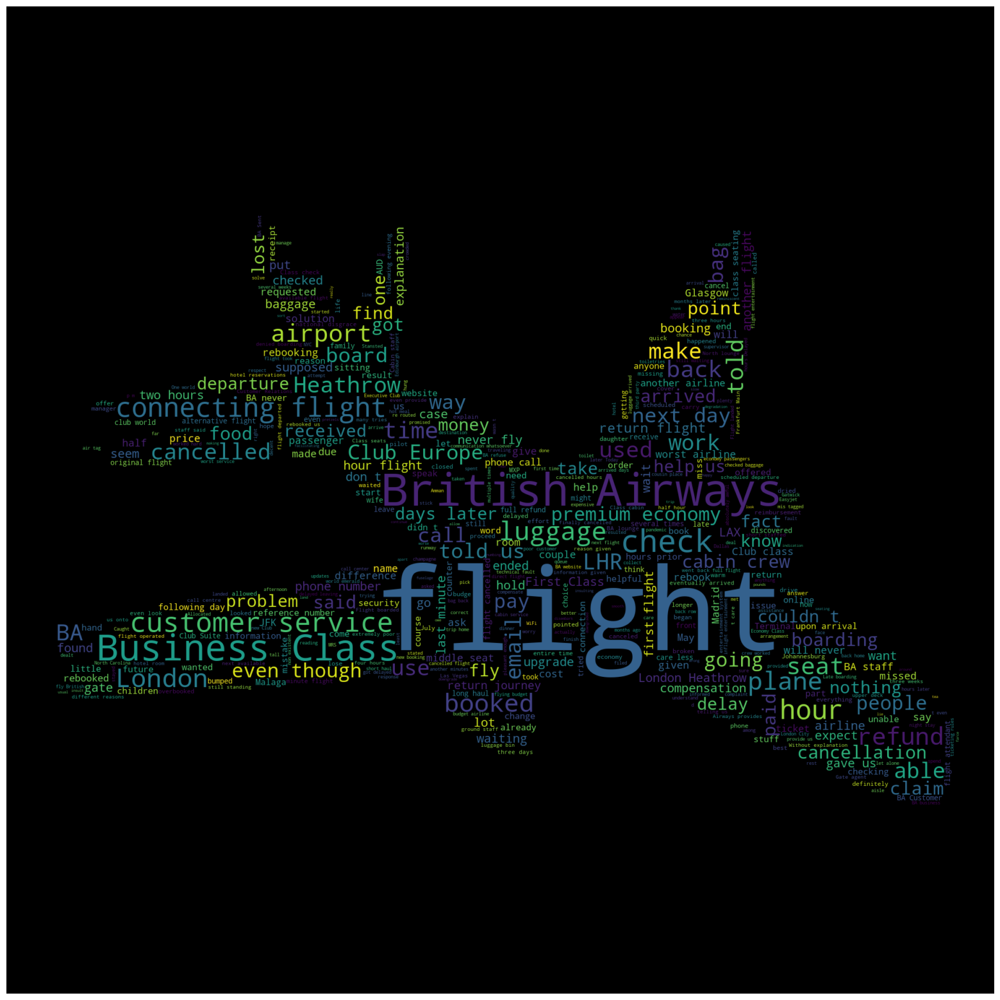

In [73]:
text_review = " ".join(review for review in BA_Scraped_data.review_datails)
plt.figure(figsize=(40,20))

stopwords = set(STOPWORDS)

custom_mask = np.array(Image.open("plane.jpg"))
wc = WordCloud(background_color = "black",
             max_font_size=300,
             max_words=500,
             stopwords = stopwords,
             height = 2000,
             width = 2500,
              mask = custom_mask)
wc.generate(text_review)

plt.imshow(wc, interpolation = "bilinear")
plt.axis("off")
plt.show

### Exclude The Identified Most used words

<function matplotlib.pyplot.show(close=None, block=None)>

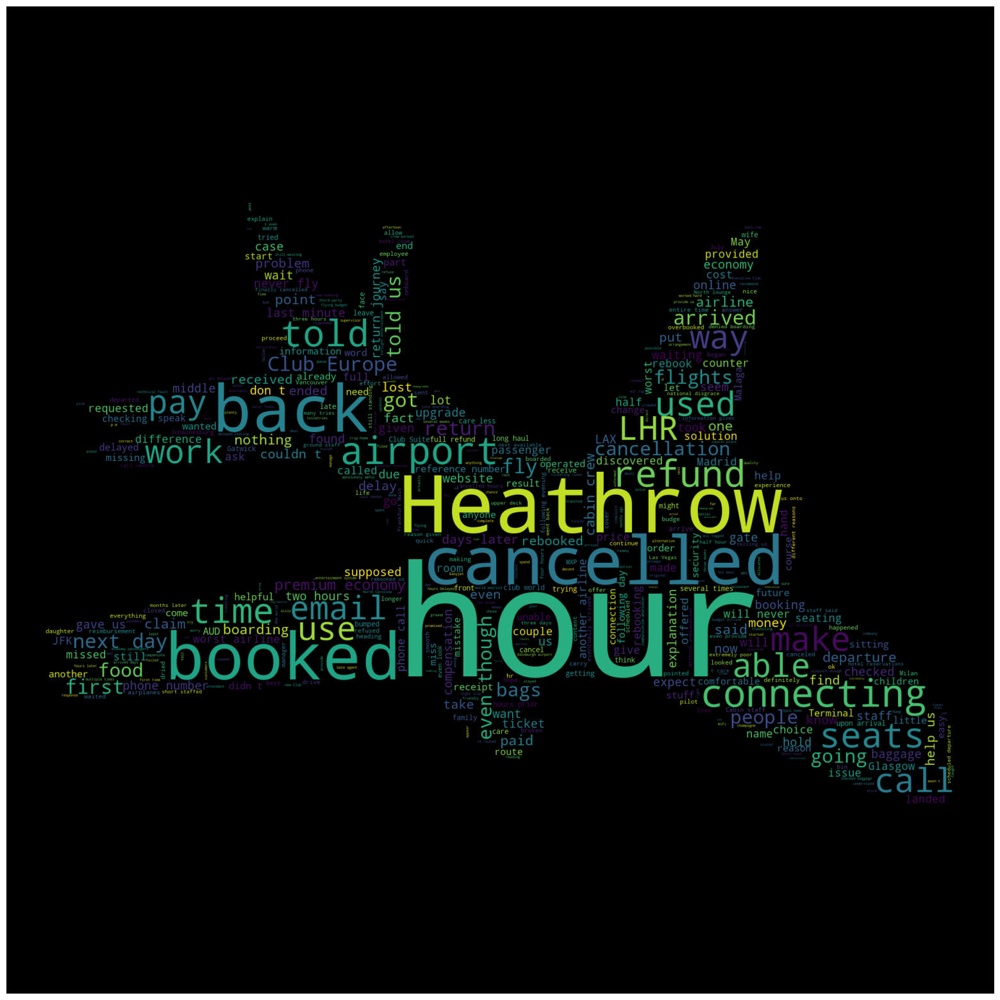

In [74]:

text_review = " ".join(review for review in BA_Scraped_data.review_datails)
plt.figure(figsize=(40,20))

stopwords = set(STOPWORDS)
stopwords.update(["seat","flight", "British","Airway", "Airways","check", "luggage","bag","board",
                  "London", "business", "class", "book","plane", "BA","customer","service"])


custom_mask = np.array(Image.open("plane.jpg"))
wc = WordCloud(background_color = "black",
             max_font_size=300,
             max_words=500,
             stopwords = stopwords,
             height = 2000,
             width = 2500,
              mask = custom_mask)
wc.generate(text_review)

plt.imshow(wc, interpolation = "bilinear")
plt.axis("off")
plt.show

In [75]:
from nltk import ngrams
from nltk.probability import FreqDist

from sklearn.feature_extraction import text
from sklearn.feature_extraction.text import TfidfVectorizer

#split the text of all reviews into a list of words
words = text_review.split(" ")

#remove certain words that will not be used to determine the positive or negative sentiment
stopwords = text.ENGLISH_STOP_WORDS.union(["seat","flight", "British","Airway", "told","check", "luggage","bag","board",
                                           "London", "business", "class", "book","plane", "would","customer","service"])


new_words = [word for word in words if word not in stopwords]

nlp_words=FreqDist(new_words).most_common(20)

#create a dataframe of these word and its frequencies
all_fdist = pd.Series(dict(nlp_words))

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]),
 [Text(0, 0, 'I'),
  Text(1, 0, ''),
  Text(2, 0, 'BA'),
  Text(3, 0, 'The'),
  Text(4, 0, '-'),
  Text(5, 0, 'We'),
  Text(6, 0, 'did'),
  Text(7, 0, 'hours'),
  Text(8, 0, 'Airways'),
  Text(9, 0, 'They'),
  Text(10, 0, 'airport'),
  Text(11, 0, 'staff'),
  Text(12, 0, 'airline'),
  Text(13, 0, 'time'),
  Text(14, 0, 'flights'),
  Text(15, 0, 'crew'),
  Text(16, 0, 'food'),
  Text(17, 0, 'seats'),
  Text(18, 0, 'booked'),
  Text(19, 0, 'help')])

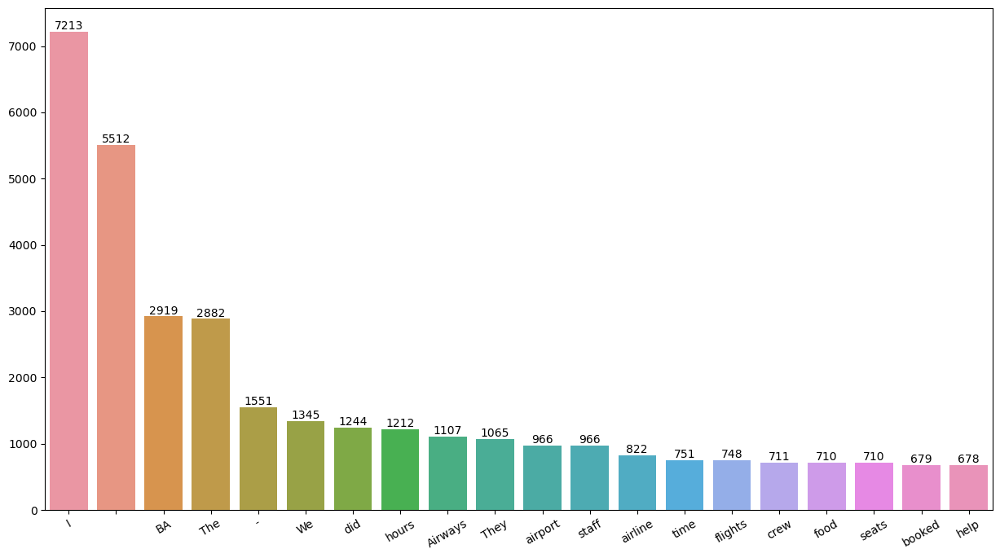

In [76]:
## Setting figure, ax into variables
fig, ax = plt.subplots(figsize=(15,8))

## Seaborn plotting using Pandas attributes + xtick rotation for ease of viewing
all_plot = sns.barplot(x=all_fdist.index, y=all_fdist.values, ax=ax)
all_plot.bar_label(all_plot.containers[0])
plt.xticks(rotation=30)

<Axes: >

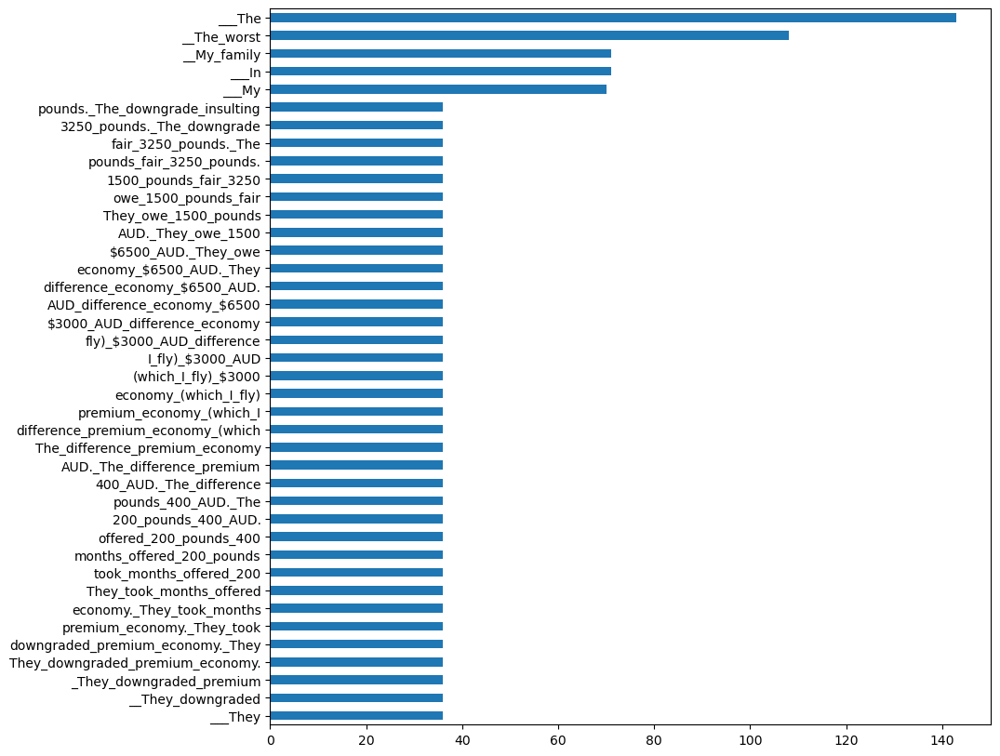

In [77]:

import nltk.collocations as collocations
from nltk import FreqDist, bigrams

reviews = " ".join(BA_Scraped_data.review_datails)

#split the text of all reviews into a list of words
words = text_review.split(" ")

new_words = [word for word in words if word not in stopwords]

def get_freq_dist(new_words,number_of_ngrams ):
    from nltk import ngrams
    
    ## Generate bigrams
    ngrams = ngrams(new_words, number_of_ngrams)

    ## Creating FreqDist
    ngram_fd = FreqDist(ngrams).most_common(40)

    ## Sort values by highest frequency
    ngram_sorted = {k:v for k,v in sorted(ngram_fd, key=lambda item:item[1])}

    ## Join bigram tokens with '_' + maintain sorting
    ngram_joined = {'_'.join(k):v for k,v in sorted(ngram_fd, key=lambda item:item[1])}

    ## Convert to Pandas series for easy plotting
    ngram_freqdist = pd.Series(ngram_joined)
    plt.figure(figsize=(10,10))
    ax = ngram_freqdist.plot(kind="barh")
    
    return ax


get_freq_dist(new_words,4)

In [78]:
BA_Scraped_data.to_csv("BA_CustomersReview.csv")

<function matplotlib.pyplot.show(close=None, block=None)>

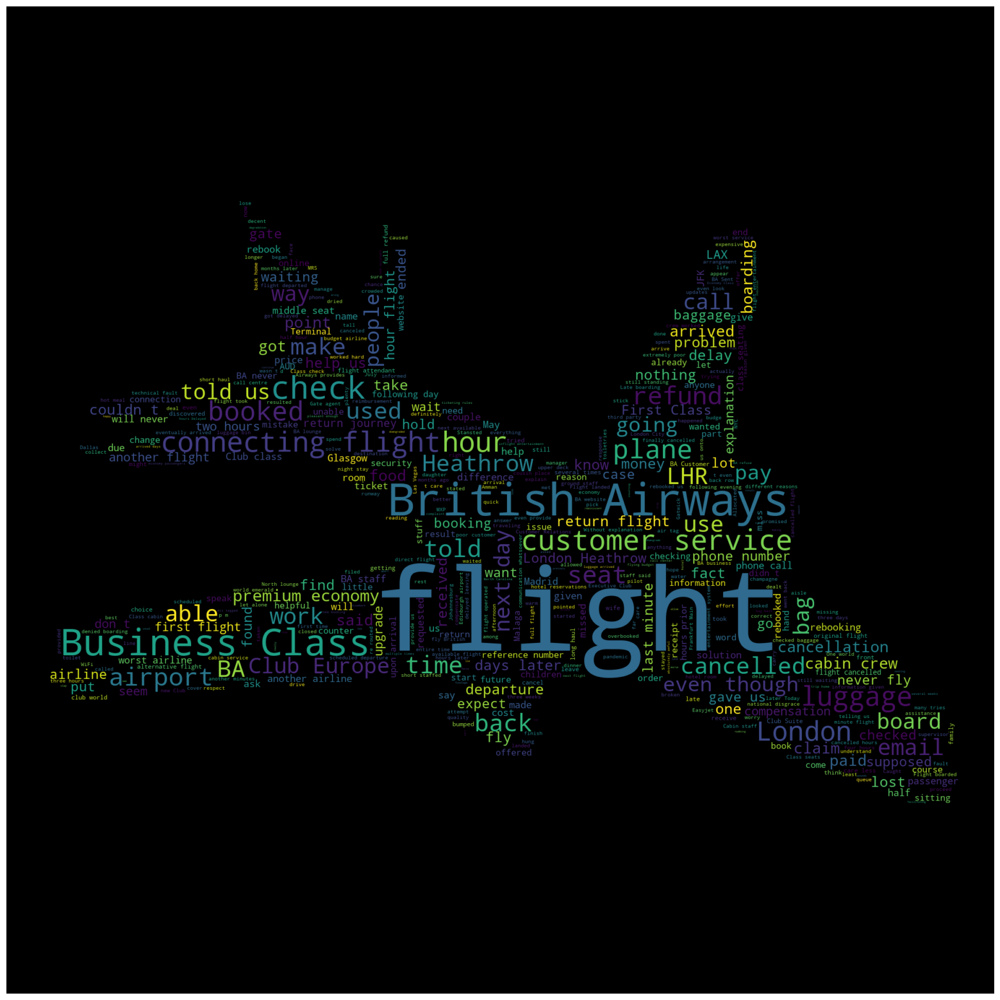

In [79]:
text_review_head = " ".join(review for review in BA_Scraped_data.review_head)
plt.figure(figsize=(40,20))

stopwords = set(STOPWORDS)

custom_mask = np.array(Image.open("plane.jpg"))
wc = WordCloud(background_color = "black",
             max_font_size=300,
             max_words=500,
             stopwords = stopwords,
             height = 2000,
             width = 2500,
              mask = custom_mask)
wc.generate(text_review)

plt.imshow(wc, interpolation = "bilinear")
plt.axis("off")
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

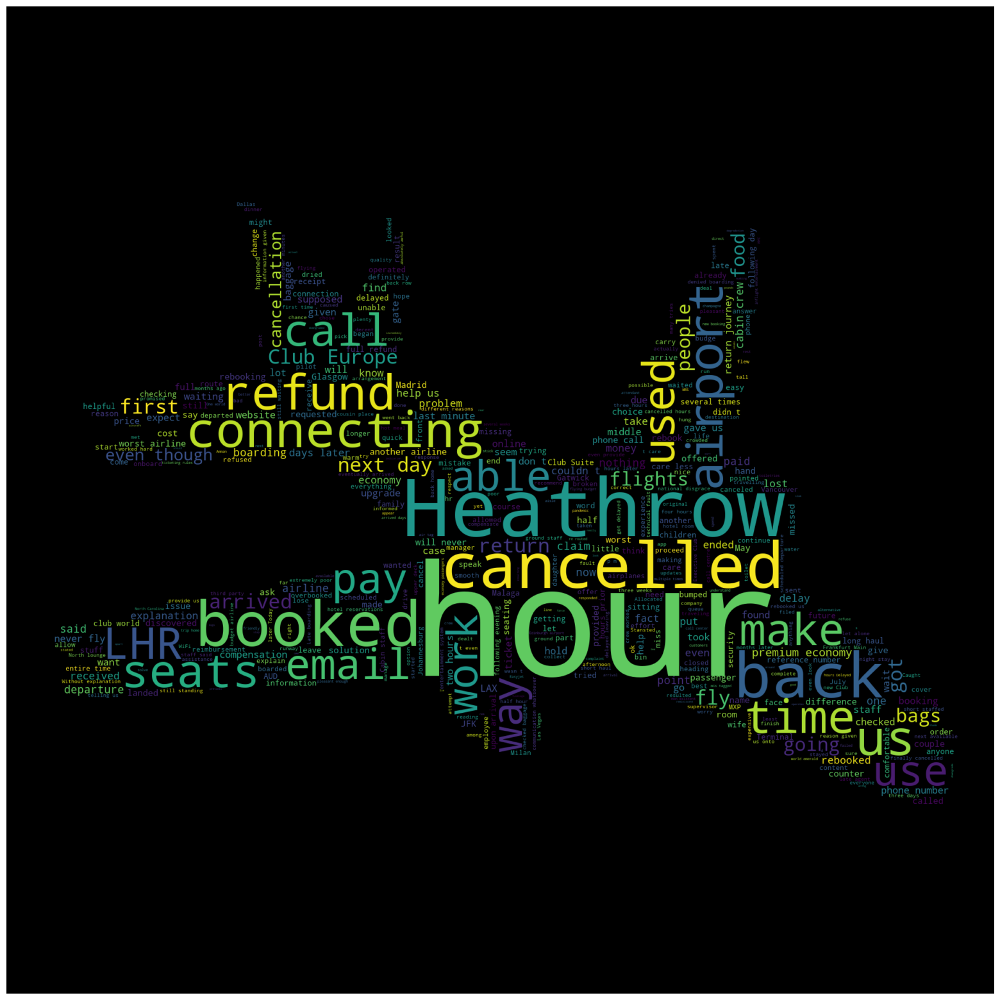

In [80]:
text_review_head = " ".join(review for review in BA_Scraped_data.review_head)
plt.figure(figsize=(40,20))

stopwords = set(STOPWORDS)
stopwords.update(["seat","flight", "British","Airway", "told","check", "luggage","bag","board",
                  "London", "business", "class", "book","plane", "Airways","customer","service", "BA"])


custom_mask = np.array(Image.open("plane.jpg"))
wc = WordCloud(background_color = "black",
             max_font_size=300,
             max_words=500,
             stopwords = stopwords,
             height = 2000,
             width = 2500,
              mask = custom_mask)
wc.generate(text_review)

plt.imshow(wc, interpolation = "bilinear")
plt.axis("off")
plt.show

In [81]:
BA_review_headRT_1 = BA_Scraped_data[BA_Scraped_data["rating_stars"] == 1]["review_head"]

In [82]:
BA_review_headRT_10 = BA_Scraped_data[BA_Scraped_data["rating_stars"] == 10]["review_head"]

<function matplotlib.pyplot.show(close=None, block=None)>

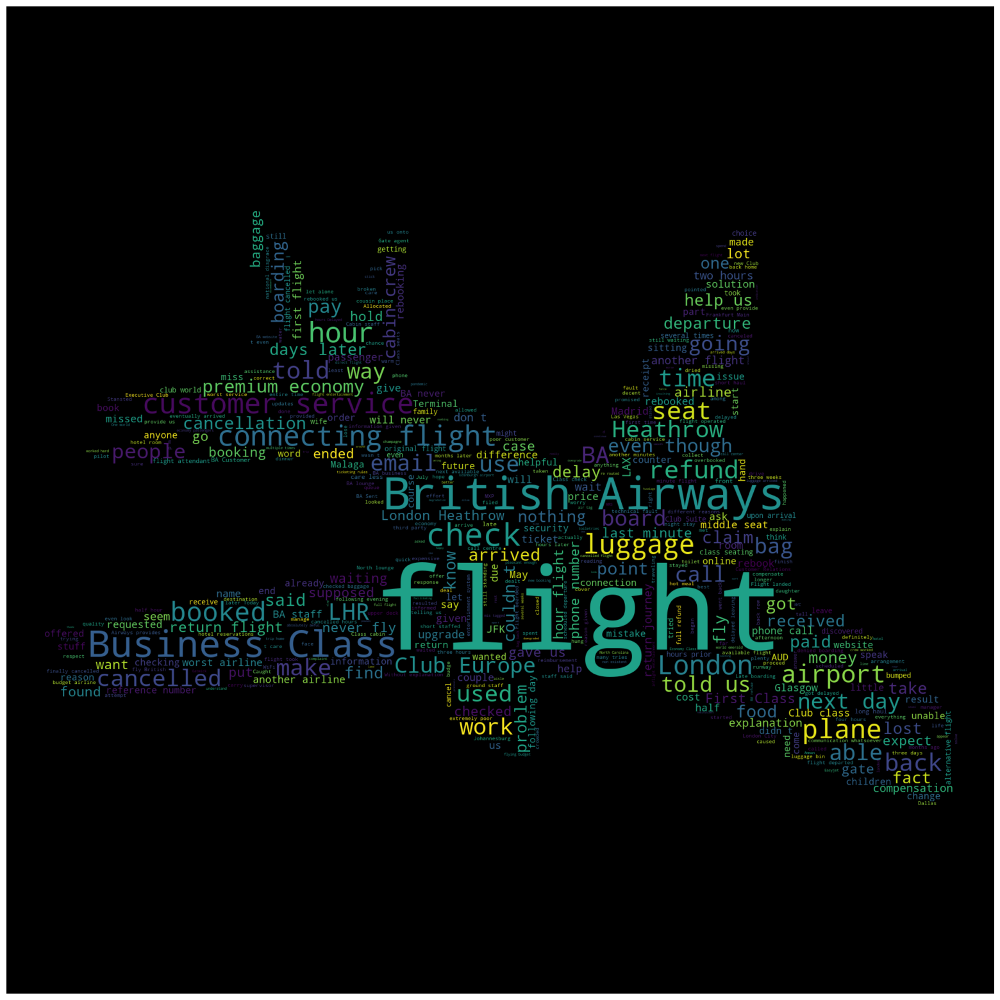

In [83]:
text_review_head_1 = " ".join(review for review in BA_review_headRT_1)
plt.figure(figsize=(40,20))

stopwords = set(STOPWORDS)

custom_mask = np.array(Image.open("plane.jpg"))
wc = WordCloud(background_color = "black",
             max_font_size=300,
             max_words=500,
             stopwords = stopwords,
             height = 2000,
             width = 2500,
              mask = custom_mask)
wc.generate(text_review)

plt.imshow(wc, interpolation = "bilinear")
plt.axis("off")
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

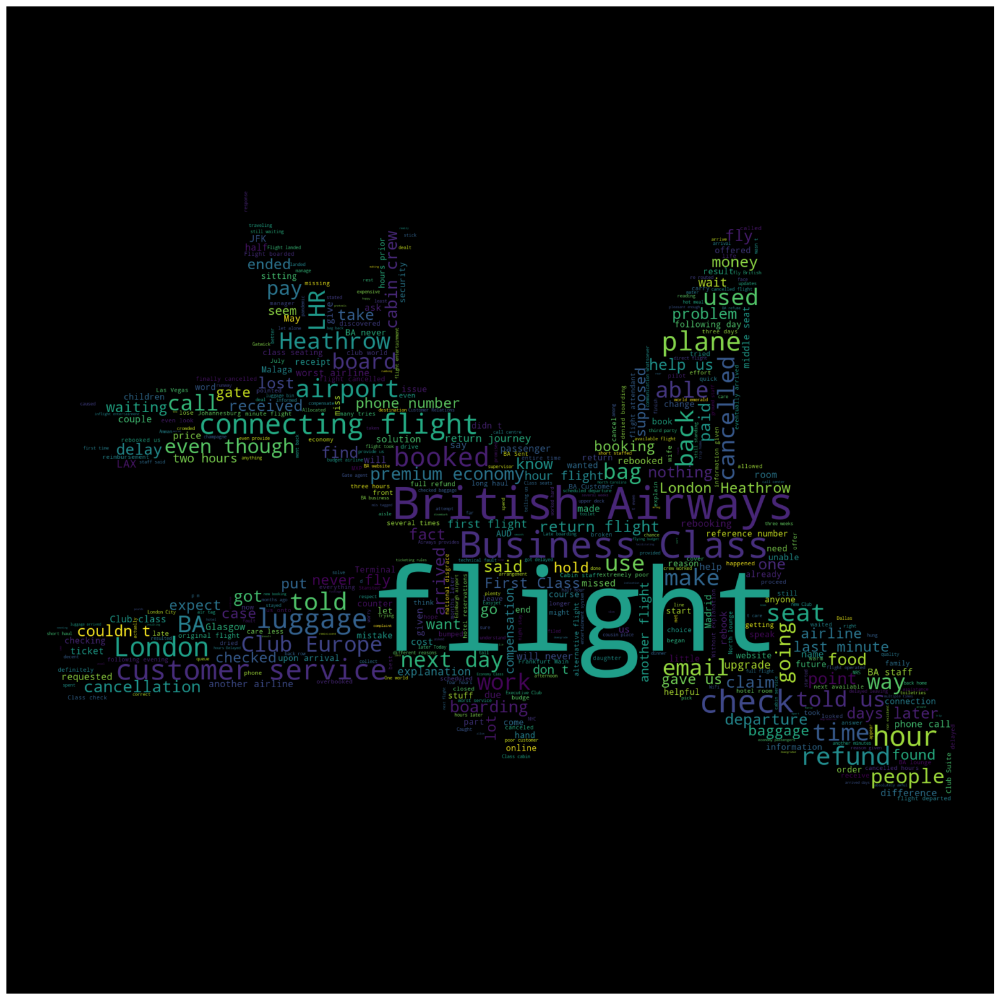

In [84]:
text_review_head_10 = " ".join(review for review in BA_review_headRT_10)
plt.figure(figsize=(40,20))

stopwords = set(STOPWORDS)

custom_mask = np.array(Image.open("plane.jpg"))
wc = WordCloud(background_color = "black",
             max_font_size=300,
             max_words=500,
             stopwords = stopwords,
             height = 2000,
             width = 2500,
              mask = custom_mask)
wc.generate(text_review)

plt.imshow(wc, interpolation = "bilinear")
plt.axis("off")
plt.show